In [1]:
%pylab inline
%config InlineBackend.figure_format = 'svg'

Populating the interactive namespace from numpy and matplotlib


In [2]:
import arviz as az
import emcee

In [3]:
Rtrue = 1000.0
Vtrue = 3.0
sigma_true = 1e-4

In [4]:
xs = logspace(log10(100), log10(10000), 100)
ys = Vtrue / (Rtrue + xs) + sigma_true*randn(100)

<ErrorbarContainer object of 3 artists>

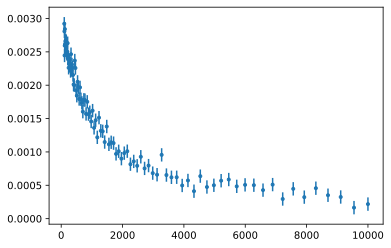

In [5]:
errorbar(xs, ys, yerr=sigma_true, fmt='.')

In [6]:
class ResistancePosterior(object):
    def __init__(self, xs, ys):
        self.xs = xs
        self.ys = ys
        self.N = len(xs)
        
    def __call__(self, theta):
        V, R, sigma = theta
        
        if V < 0:
            return np.NINF
        if R < 0:
            return np.NINF
        if sigma < 0:
            return np.NINF
        
        return -0.5*self.N*log(2*pi) - self.N*log(sigma) - 0.5*np.sum(np.square((self.ys - V/(R + self.xs))/sigma))

In [7]:
logpost = ResistancePosterior(xs, ys)

In [8]:
sampler = emcee.EnsembleSampler(16, 3, logpost)

In [9]:
istate = array([Vtrue, Rtrue, sigma_true]) + 1e-5*randn(16, 3)

In [10]:
state, lnprobs, rstate = sampler.run_mcmc(istate, 1024, progress=True)

/Users/wfarr/anaconda3/lib/python3.7/site-packages/emcee/ensemble.py:258: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  category=RuntimeWarning,
100%|██████████| 1024/1024 [00:00<00:00, 1152.68it/s]


In [14]:
sampler.reset()
state, lnprobs, rstate = sampler.run_mcmc(state, 16384, progress=True)

/Users/wfarr/anaconda3/lib/python3.7/site-packages/emcee/ensemble.py:258: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  category=RuntimeWarning,
100%|██████████| 16384/16384 [00:15<00:00, 1088.65it/s]


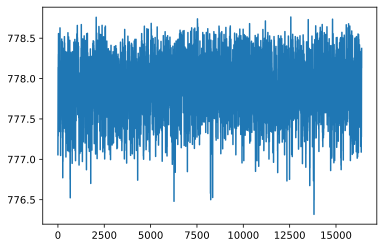

In [15]:
plot(mean(sampler.lnprobability, axis=0))

In [16]:
asampler = az.from_emcee(sampler, var_names=['V', 'R', 'sigma'])

In [17]:
az.plot_trace(asampler)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11b3c1390>,
      dtype=object)

In [18]:
az.effective_sample_size(asampler)

<xarray.Dataset>
Dimensions:  ()
Data variables:
    V        float64 6.23e+03
    R        float64 6.236e+03
    sigma    float64 5.973e+03

(<matplotlib.axes._subplots.AxesSubplot at 0x11b97dd68>,
 <matplotlib.axes._subplots.AxesSubplot at 0x120c50b38>)

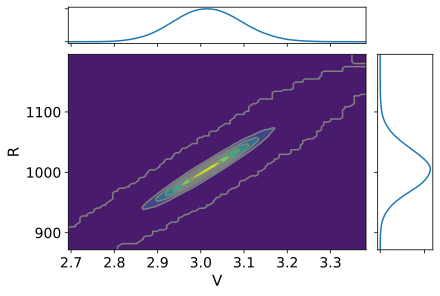

In [20]:
az.plot_joint(asampler, var_names=['V', 'R'], kind='kde')

In [21]:
az.to_netcdf(asampler, "samples.nc")

'samples.nc'

In [22]:
asampler = az.from_netcdf("samples.nc")

In [24]:
asampler.posterior

<xarray.Dataset>
Dimensions:  (chain: 16, draw: 16384)
Coordinates:
  * chain    (chain) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15
  * draw     (draw) int64 0 1 2 3 4 5 6 ... 16378 16379 16380 16381 16382 16383
Data variables:
    V        (chain, draw) float64 ...
    R        (chain, draw) float64 ...
    sigma    (chain, draw) float64 ...
Attributes:
    created_at:                 2019-10-22T14:59:46.783562
    inference_library:          emcee
    inference_library_version:  3.0.0

(array([4.000e+00, 4.000e+00, 1.000e+00, 5.000e+00, 5.000e+00, 4.000e+00,
        2.000e+01, 1.600e+01, 3.800e+01, 2.200e+01, 2.500e+01, 2.400e+01,
        3.900e+01, 5.300e+01, 8.300e+01, 1.240e+02, 1.920e+02, 2.100e+02,
        2.700e+02, 4.300e+02, 5.400e+02, 7.020e+02, 8.440e+02, 9.580e+02,
        1.192e+03, 1.455e+03, 1.769e+03, 1.937e+03, 2.364e+03, 2.793e+03,
        3.209e+03, 3.640e+03, 4.118e+03, 4.610e+03, 5.225e+03, 5.861e+03,
        6.119e+03, 6.737e+03, 7.231e+03, 7.839e+03, 8.000e+03, 8.501e+03,
        8.871e+03, 8.938e+03, 8.940e+03, 9.369e+03, 9.108e+03, 9.300e+03,
        9.055e+03, 8.996e+03, 8.948e+03, 8.524e+03, 8.125e+03, 7.594e+03,
        7.449e+03, 7.013e+03, 6.415e+03, 5.728e+03, 5.403e+03, 4.776e+03,
        4.435e+03, 3.953e+03, 3.336e+03, 3.126e+03, 2.769e+03, 2.235e+03,
        1.953e+03, 1.929e+03, 1.604e+03, 1.264e+03, 1.229e+03, 7.650e+02,
        6.290e+02, 6.250e+02, 5.090e+02, 4.110e+02, 3.260e+02, 2.770e+02,
        2.210e+02, 1.970e+02, 1.330e+0

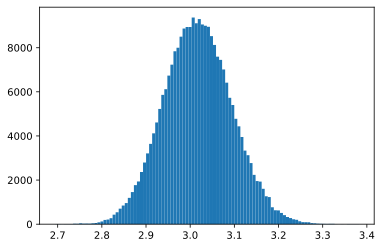

In [26]:
hist(asampler.posterior.V.values.flatten(), bins=100)